# APPLICATION OF ANALYTICS


In [1]:
import pandas as pd

In [2]:
df = pd.read_csv('supermarket_sales.csv')

In [3]:
df

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,1/5/2019,13:08,Ewallet,522.83,4.761905,26.1415,9.1
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,3/8/2019,10:29,Cash,76.40,4.761905,3.8200,9.6
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,3/3/2019,13:23,Credit card,324.31,4.761905,16.2155,7.4
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,1/27/2019,20:33,Ewallet,465.76,4.761905,23.2880,8.4
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2/8/2019,10:37,Ewallet,604.17,4.761905,30.2085,5.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,233-67-5758,C,Naypyitaw,Normal,Male,Health and beauty,40.35,1,2.0175,42.3675,1/29/2019,13:46,Ewallet,40.35,4.761905,2.0175,6.2
996,303-96-2227,B,Mandalay,Normal,Female,Home and lifestyle,97.38,10,48.6900,1022.4900,3/2/2019,17:16,Ewallet,973.80,4.761905,48.6900,4.4
997,727-02-1313,A,Yangon,Member,Male,Food and beverages,31.84,1,1.5920,33.4320,2/9/2019,13:22,Cash,31.84,4.761905,1.5920,7.7
998,347-56-2442,A,Yangon,Normal,Male,Home and lifestyle,65.82,1,3.2910,69.1110,2/22/2019,15:33,Cash,65.82,4.761905,3.2910,4.1


# Problem Statement 

As always, EDA with great insights. At the end, your mention some actionable items for a business, that it can do to perform better. 

![](https://media.giphy.com/media/ukwPlCmJ5RmlqvQCpA/giphy.gif)


# Let the game begin

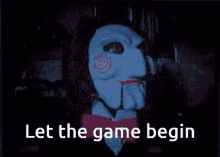

In [77]:
df.dtypes

Invoice ID                         object
Branch                             object
City                               object
Customer type                      object
Gender                             object
Product line                       object
Unit price                        float64
Quantity                            int64
Tax 5%                            float64
Total                             float64
Date                       datetime64[ns]
Time                               object
Payment                            object
cogs                              float64
gross margin percentage           float64
gross income                      float64
Rating                            float64
Month                              object
Month Name                         object
dtype: object

In [4]:
# Checking Null values
df.isnull().sum()

Invoice ID                 0
Branch                     0
City                       0
Customer type              0
Gender                     0
Product line               0
Unit price                 0
Quantity                   0
Tax 5%                     0
Total                      0
Date                       0
Time                       0
Payment                    0
cogs                       0
gross margin percentage    0
gross income               0
Rating                     0
dtype: int64

### There are no missing value and the data set is clean so we will continue with data visualization.

# Visualizations

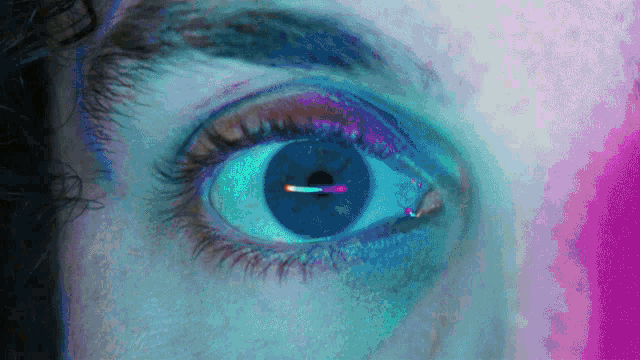

## Importing Libraries

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt

# Univariate Analysis 

C:\Users\Prerna Bhatnagar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


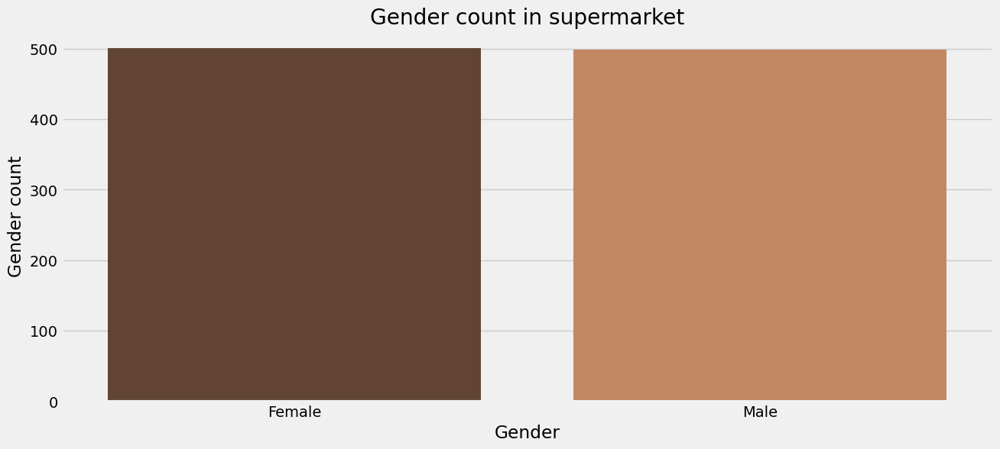

In [8]:
plt.figure(figsize=(14,6))
ax= sns.countplot('Gender', data=df , palette = 'copper')
ax.set_xlabel(xlabel= "Gender")
ax.set_ylabel(ylabel = "Gender count")
ax.set_title(label = "Gender count in supermarket")
plt.show()

### The number of males and females entering the store is almost equal.

In [10]:
df.groupby(['Gender']). agg({'Total':'sum'})

,Total
Gender,
Female,167882.925
Male,155083.824


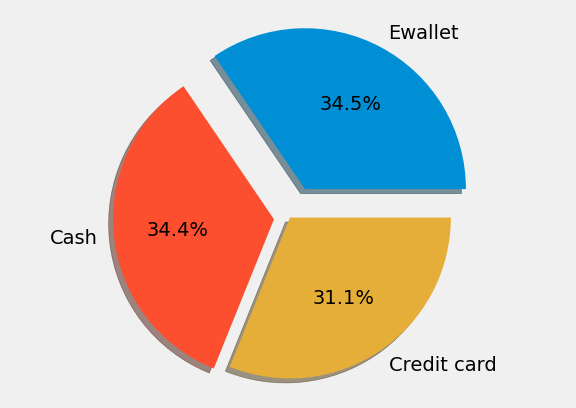

In [16]:
explode = (0.2,0.1,0)
labels = df['Payment'].value_counts().index
sizes = df['Payment'].value_counts().values
plt.pie(sizes, labels=labels, autopct='%1.1f%%',shadow=True,explode=explode)
plt.axis('equal')
plt.show()

### The most popular payment method is in-fact E-wallet and not credit cards.Cash payment is also popular

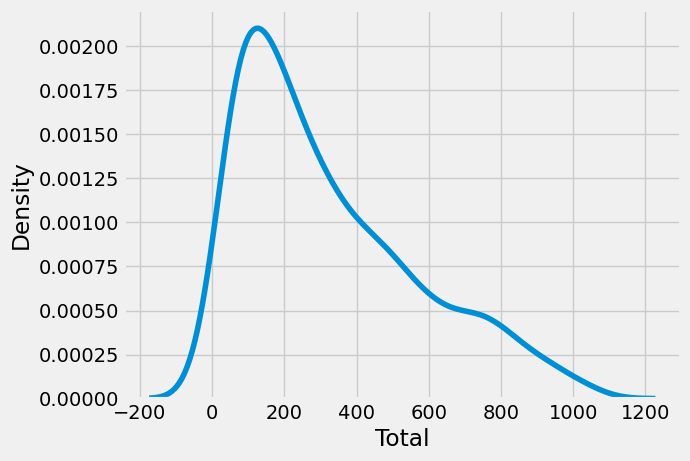

In [12]:
sns.kdeplot(df['Total'])
plt.show()

# Bivariate Analysis

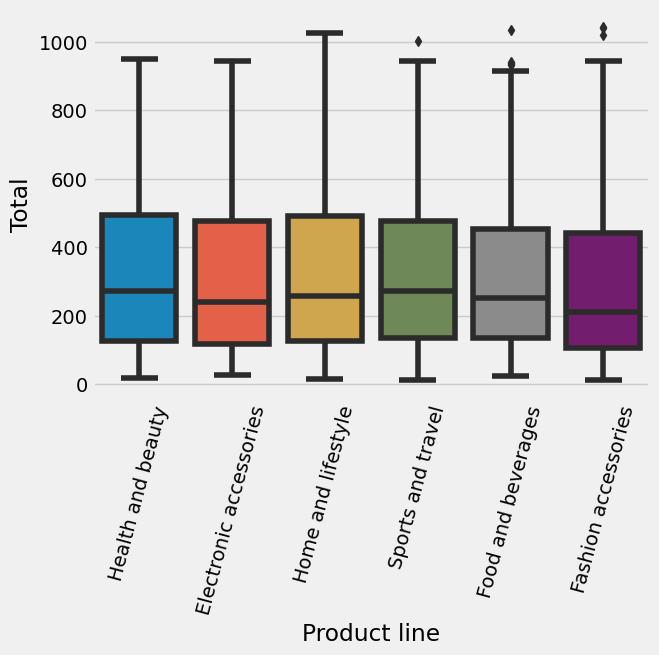

In [17]:
sns.boxplot(x='Product line', y='Total', data=df)
plt.xticks(rotation=75)
plt.show()

Text(0, 0.5, 'Customer Count')

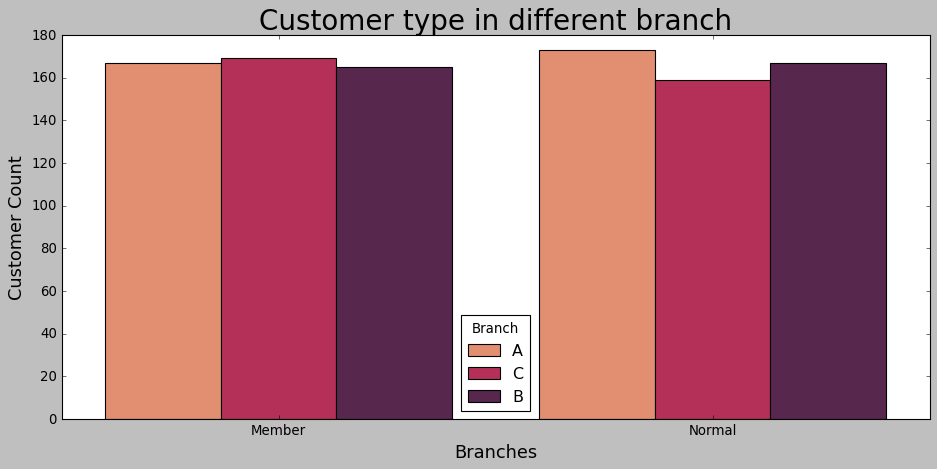

In [19]:
plt.figure(figsize=(14,6))
ax = sns.countplot(x = "Customer type", hue = "Branch", data = df, palette= "rocket_r")
ax.set_title(label = "Customer type in different branch", fontsize = 25)
ax.set_xlabel(xlabel = "Branches", fontsize = 16)
ax.set_ylabel(ylabel = "Customer Count", fontsize = 16)

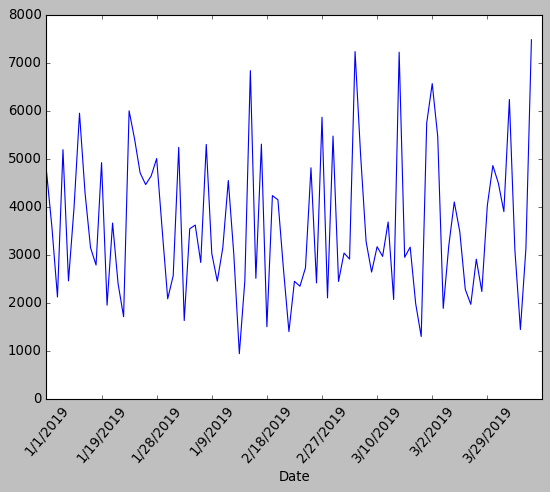

In [29]:
df.groupby('Date')['Total'].sum().plot()
plt.xticks(rotation=50)
plt.show()

### On some days gross income is pretty high or low. Overall it remains at a certain average level

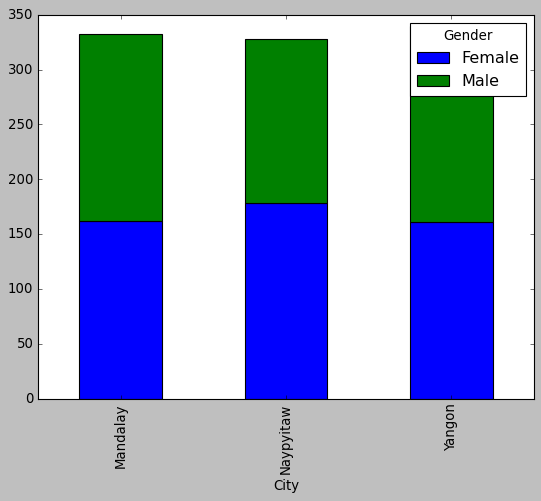

In [21]:
pd.crosstab(df['City'], df['Gender']).plot(kind='bar', stacked=True)
plt.show()

Text(0, 0.5, 'Peple Count')

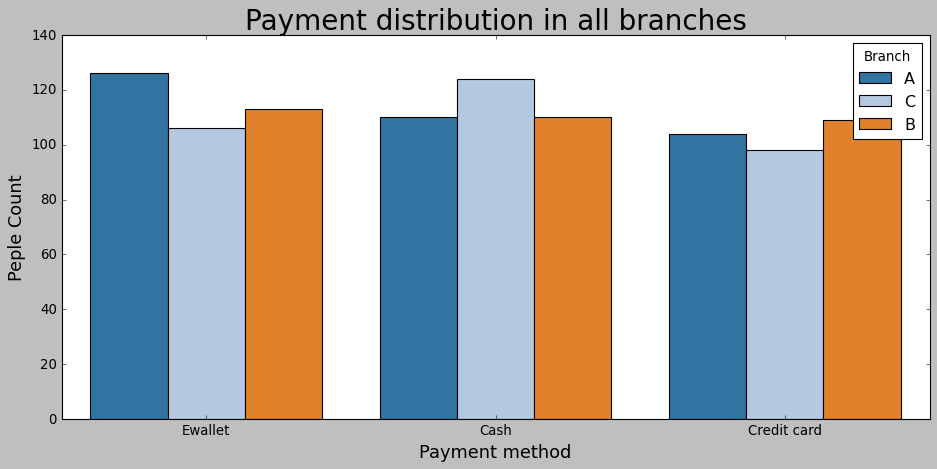

In [23]:
plt.figure(figsize = (14,6))
ax = sns.countplot(x="Payment", hue = "Branch", data = df, palette= "tab20")
ax.set_title(label = "Payment distribution in all branches", fontsize= 25)
ax.set_xlabel(xlabel = "Payment method", fontsize = 16)
ax.set_ylabel(ylabel = "Peple Count", fontsize = 16)

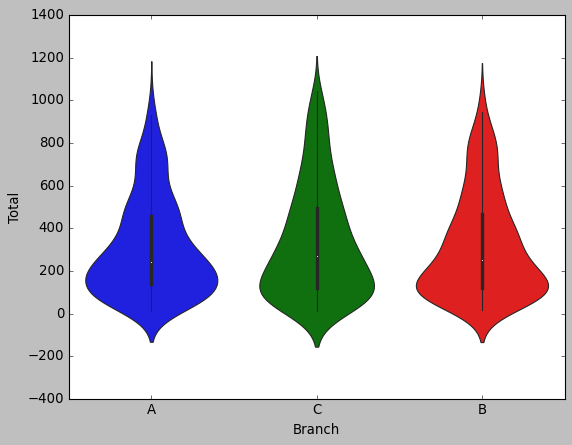

In [24]:
sns.violinplot(x='Branch', y='Total', data=df)
plt.show()

Text(0, 0.5, 'Rating distribution')

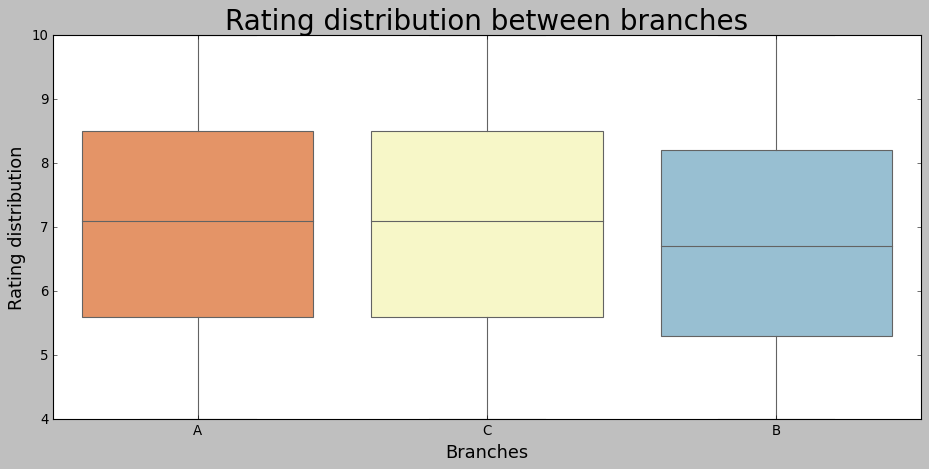

In [26]:
plt.figure(figsize=(14,6)) 
ax = sns.boxplot(x="Branch", y = "Rating" ,data =df, palette= "RdYlBu")
ax.set_title("Rating distribution between branches", fontsize = 25)
ax.set_xlabel(xlabel = "Branches", fontsize = 16)
ax.set_ylabel(ylabel = "Rating distribution", fontsize = 16)

### The average rating of branch A and C is more than seven and branch B is less than 7

C:\Users\Prerna Bhatnagar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Health and beauty'),
  Text(1, 0, 'Electronic accessories'),
  Text(2, 0, 'Home and lifestyle'),
  Text(3, 0, 'Sports and travel'),
  Text(4, 0, 'Food and beverages'),
  Text(5, 0, 'Fashion accessories')])

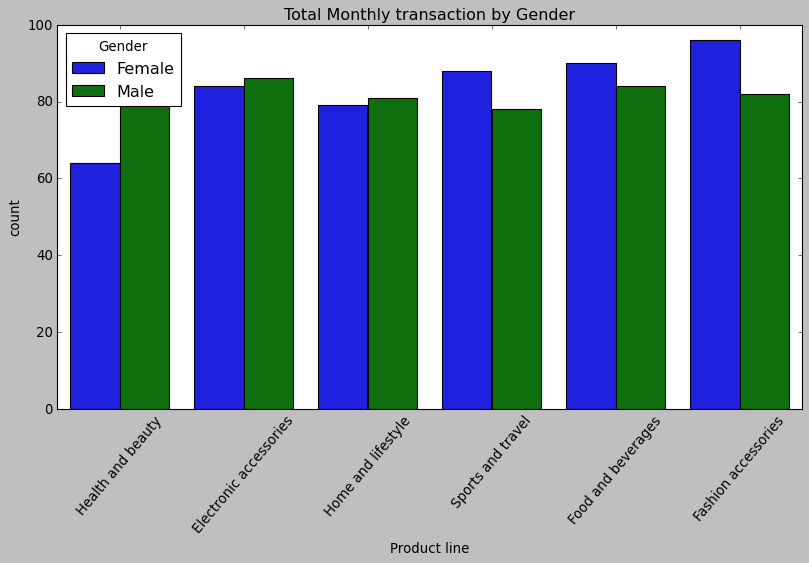

In [30]:
plt.figure(figsize=(12, 6))
plt.title('Total Monthly transaction by Gender')
sns.countplot(df['Product line'], hue = df.Gender)
plt.xticks(rotation=50)

### Females spend on 'fashion accessories' the most and for males it is 'Health and beauty'. Females also spend more on 'Sports and travel'

In [74]:
import datetime
# Define a function to convert a datetime object to the name of the corresponding month
def get_month_name(date):
    return datetime.date(date.year, date.month, 1).strftime('%B')

# Apply the function to the 'Date' column and store the result in a new column 'Month Name'
df['Month'] = df['Date'].apply(get_month_name)

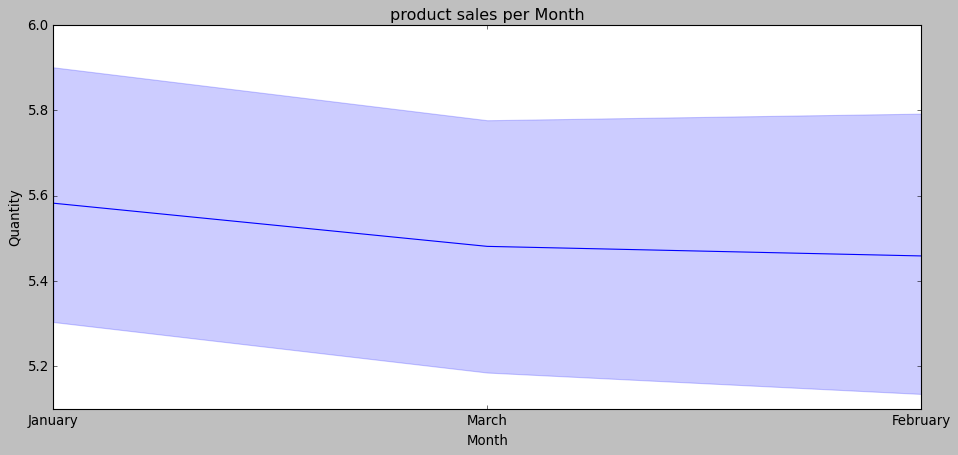

In [76]:
plt.figure(figsize=(14,6))
SalesTime = sns.lineplot(x="Month", y ="Quantity", data = df).set_title("product sales per Month")

Text(0, 0.5, 'Product Line')

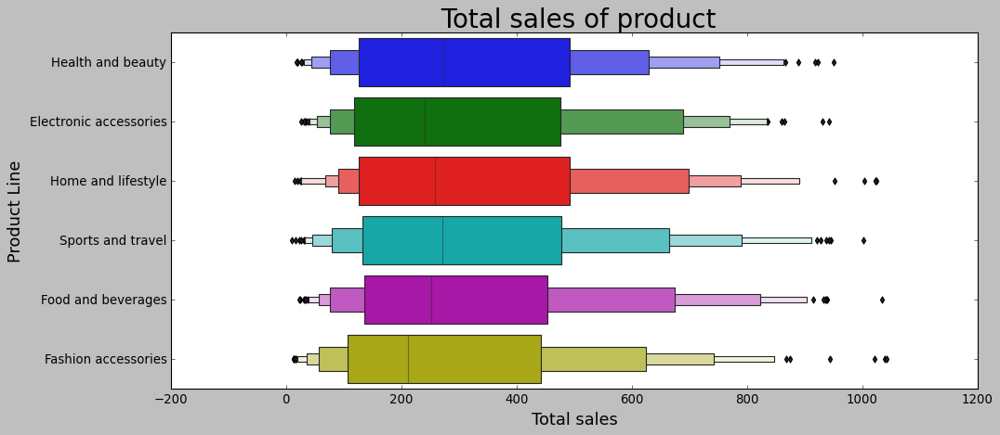

In [33]:
plt.figure(figsize=(14,6))
ax = sns.boxenplot(y= "Product line", x= "Total", data = df)
ax.set_title(label = " Total sales of product", fontsize = 25)
ax.set_xlabel(xlabel = "Total sales", fontsize = 16)
ax.set_ylabel(ylabel = "Product Line", fontsize = 16)

C:\Users\Prerna Bhatnagar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0, 0.5, 'Gross income')

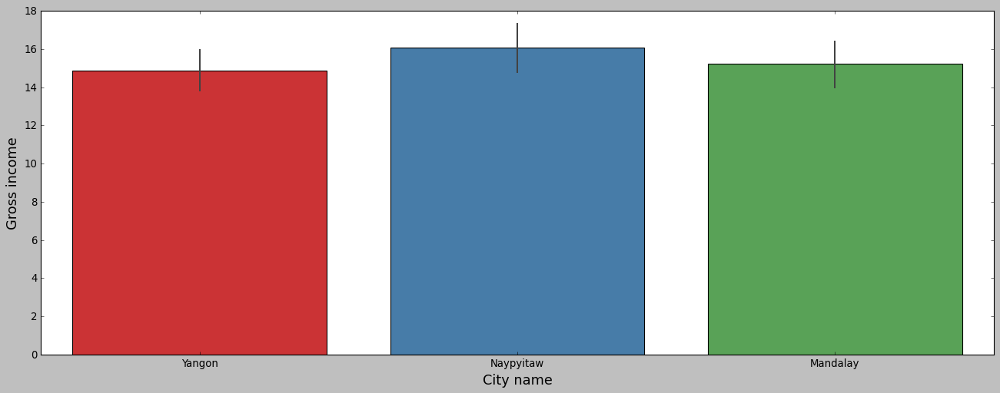

In [34]:
plt.figure(figsize=(20,7))
sns.barplot(df['City'],df['gross income'],palette='Set1')
plt.xlabel('City name',fontsize='16')
plt.ylabel('Gross income',fontsize='16')

### Naypyitaw is the most profitable city so the comoany can think of expansion plan in this city.

Text(0, 0.5, 'Product Line')

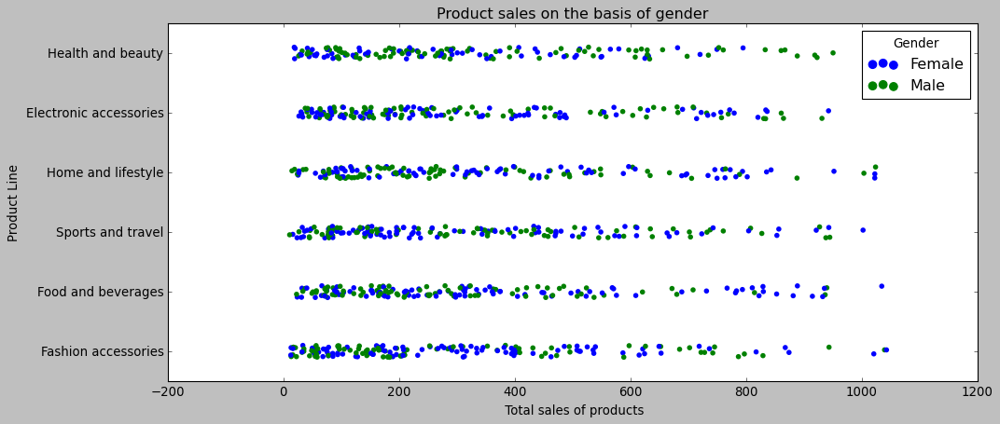

In [36]:
plt.figure(figsize = (14,6))
ax= sns.stripplot(y= "Product line", x = "Total", hue = "Gender", data = df)
ax.set_title(label = "Product sales on the basis of gender")
ax.set_xlabel(xlabel = " Total sales of products")
ax.set_ylabel(ylabel = "Product Line")

### Female buyers are more in Fashion Accessories product line

<AxesSubplot:xlabel='Branch', ylabel='gross income'>

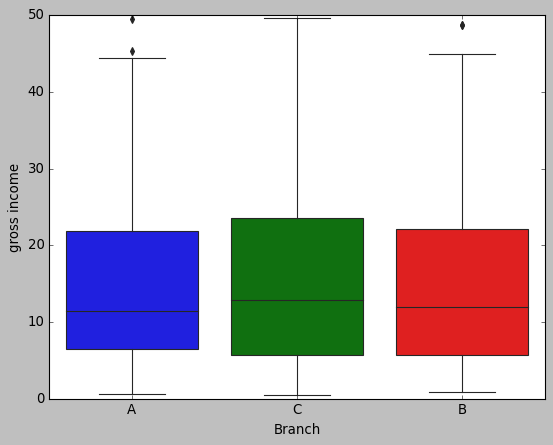

In [37]:
sns.boxplot(x=df['Branch'], y=df['gross income'])

### There is not much difference in gross income by branches at an average level. Branch C has a slightly higher income than A or B.As observed earlier,though branch A has slightly higher sales than the rest,C i.e. Naypyitaw is the most profitable branch in terms of gross income

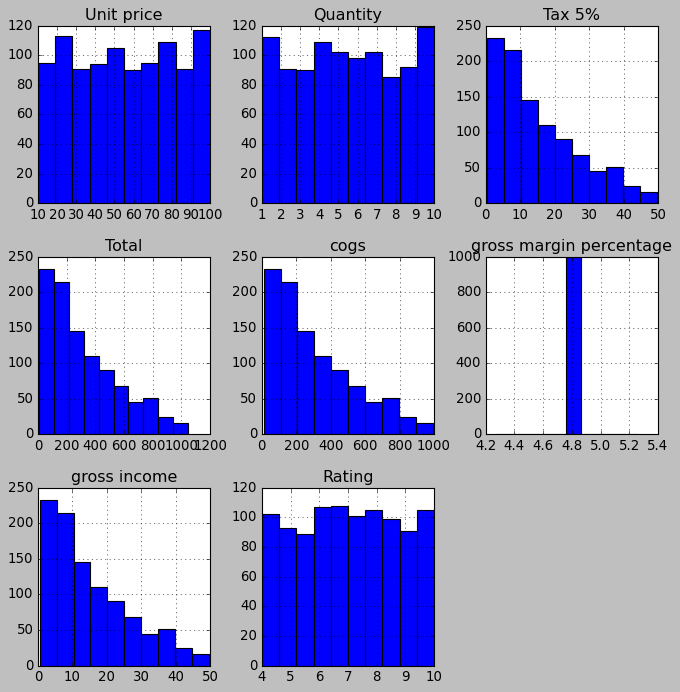

In [38]:
df.hist(figsize=(10, 10))
plt.show()

### Heatmap

<AxesSubplot:>

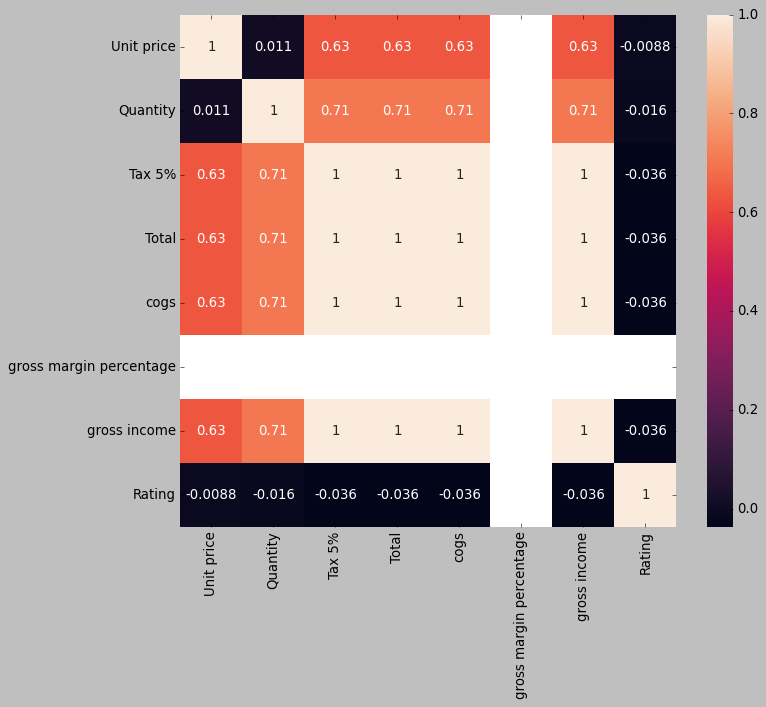

In [39]:
plt.figure(figsize = (10,8))
sns.heatmap(df.corr(), annot =True)

### Unit price is positively correlated to cogs with 63% correlation. Another interesting observation is that ‘Ratings’ hardly has any correlation with any other variables.As is obvious, Quantity and gross income has very high correlation of 70%.

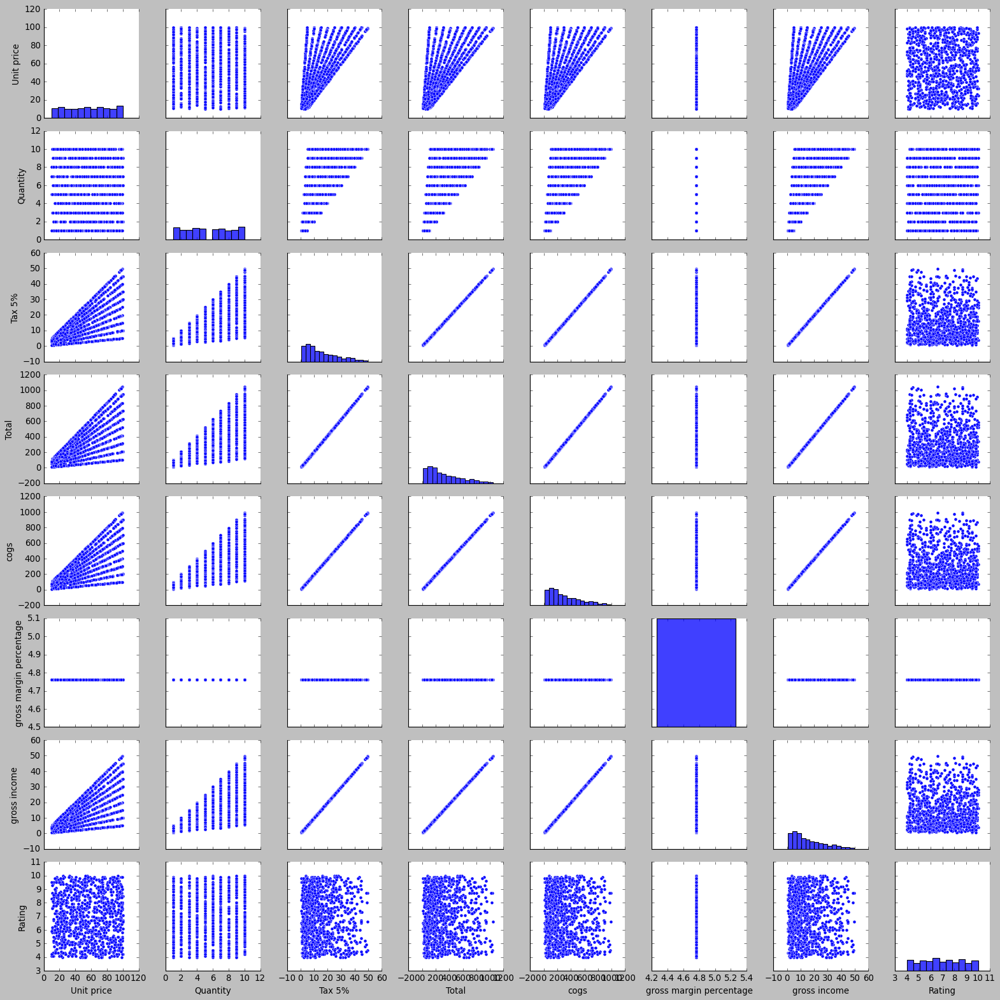

In [40]:
sns.pairplot(data=df)

# Observations

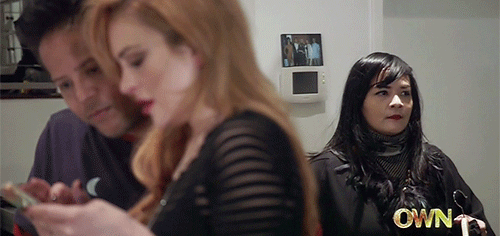

### There is no relationship between gross income and customer ratings.
### Branch A has slightly higher sales than the rest but C i.e. Naypyitaw is most profitable branch.
### Fashion accessories and food and beverages are the most sold product in Naypyitaw.
### The most popular payment method is E-wallet and cash payment is also on the higher side.
### At an overall level, ‘Sports and Travel’ generates highest gross income.
### Females spend on ‘fashion accessories’ the most and for males surprisingly it is ‘Health and beauty’. 
###  Rating is not related to any variable.
### Though the rating for ‘fashion accessories’ and ‘food and beverages’ is high but the quantity purchased is low. Hence, supply for these products need to be increased.

# Done

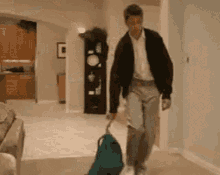